# Still a divided city? Exploration of Airbnb data in Berlin

Explorative data analysis of the Berlin AirBnB dataset from 13-Oct-2020

![Berlin](img/berlin.jpg)


## 1. Business understanding

[Airbnb](https://www.airbnb.com/) is an online marketplace where people can offer and rent out their houses and apartments. Airbnb earns profit by charging a service fee to both rental hosts and guests. Airbnb became extremely successful for tourists and business peolpe, who are looking for an overnight accomondation. The purpose of this analysis is to examine the Airbnb data in Berlin with particular regard to the differences between the former East and West.

**Questions:**

**1. What are the key factors that influence the price?**

For the vast majority of people, the price of accommodation plays a decisive role. To this end, we will first examine the key factors that influence an accommodation offer's cost. Among other things, we try to determine whether the location (e.g., if the accommodation is located in the former East/West part), certain neighborhoods, or specific amenities correlate significantly with the price. These insights are worth knowing for guests looking for accommodation and hosts who can determine their price given the competition.

**2. Where are the most expensive neighbourhoods?**

From 1961 until the destruction in 1989 and Germany's reunification in 1990, East- and West Berlin grew under entirely different conditions with two separate and distinct city centers. Where are the most expensive districts? Are they located in the two independent former city centers of East and West Berlin, or has Berlin found its reunified city center?

**3. Where are the most popular neighbourhoods?**

Are the most expensive districts also the most popular? Or do we see a reverse trend, with popular and less expensive neighborhoods? Can we find differences between the former eastern and western part of the city. 

## 2. Data understanding

The analysed dataset was downloaded directly from the [AirBnB webpage](http://insideairbnb.com/get-the-data.html).
Specifically, the following files were used for this analysis:

* `listings.csv.gz` – Summary information and metrics for listings in Berlin.
* `reviews.csv.gz` – Summary Review data and Listing ID (to facilitate time based analytics and visualisations linked to a listing).
* `neighbourhoods.csv` – Neighbourhood list for geo filter. Sourced from city or open source GIS files.
* `neighbourhoods.geojson` – GeoJSON file of neighbourhoods of the city.


First, we will import required packages, access and explore the data.

**Import required packages**

In [1]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from collections import Counter
from scipy.stats import zscore
from wordcloud import WordCloud
from tqdm import tqdm

# set options
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
pd.set_option('display.max_rows', 100)
pd.options.mode.chained_assignment = None
sns.set(font_scale=1.4)
sns.set_theme(style="white")

**Access data**

In [2]:
# import listings and review data
df_full = pd.read_csv('./data/listings.csv.gz')
df_full.head().T

,0,1,2,3,4
id,2015,3176,3309,7071,9991
listing_url,https://www.airbnb.com/rooms/2015,https://www.airbnb.com/rooms/3176,https://www.airbnb.com/rooms/3309,https://www.airbnb.com/rooms/7071,https://www.airbnb.com/rooms/9991
scrape_id,20201013162227,20201013162227,20201013162227,20201013162227,20201013162227
last_scraped,2020-10-21,2020-10-20,2020-10-21,2020-10-19,2020-10-20
name,Berlin-Mitte Value! Quiet courtyard/very central,Fabulous Flat in great Location,BerlinSpot Schöneberg near KaDeWe,BrightRoom with sunny greenview!,Geourgeous flat - outstanding views
description,Great location! <br />30 of 75 sq meters. Thi...,This beautiful first floor apartment is situa...,First of all:<br />I prefer short-notice booki...,Cozy and large room in the beautiful district ...,4 bedroom with very large windows and outstand...
neighborhood_overview,It is located in the former East Berlin area o...,The neighbourhood is famous for its variety of...,"My flat is in the middle of West-Berlin, direc...","Great neighborhood with plenty of Cafés, Baker...",Prenzlauer Berg is an amazing neighbourhood wh...
picture_url,https://a0.muscache.com/pictures/260fd609-710a...,https://a0.muscache.com/pictures/243355/84afcf...,https://a0.muscache.com/pictures/29054294/b1fa...,https://a0.muscache.com/pictures/21278/32a1622...,https://a0.muscache.com/pictures/42799131/59c8...
host_id,2217,3718,4108,17391,33852
host_url,https://www.airbnb.com/users/show/2217,https://www.airbnb.com/users/show/3718,https://www.airbnb.com/users/show/4108,https://www.airbnb.com/users/show/17391,https://www.airbnb.com/users/show/33852


**Explore data**

In [3]:
print('(Rows, Columns):', df_full.shape)

(Rows, Columns): (20227, 74)


In [4]:
# check dtypes
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20227 entries, 0 to 20226
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            20227 non-null  int64  
 1   listing_url                                   20227 non-null  object 
 2   scrape_id                                     20227 non-null  int64  
 3   last_scraped                                  20227 non-null  object 
 4   name                                          20195 non-null  object 
 5   description                                   19709 non-null  object 
 6   neighborhood_overview                         11054 non-null  object 
 7   picture_url                                   20227 non-null  object 
 8   host_id                                       20227 non-null  int64  
 9   host_url                                      20227 non-null 

In [5]:
# check for missing values
df_full.isnull().sum()

id                                                  0
listing_url                                         0
scrape_id                                           0
last_scraped                                        0
name                                               32
description                                       518
neighborhood_overview                            9173
picture_url                                         0
host_id                                             0
host_url                                            0
host_name                                          12
host_since                                         12
host_location                                      60
host_about                                      10071
host_response_time                              10173
host_response_rate                              10173
host_acceptance_rate                             7174
host_is_superhost                                  12
host_thumbnail_url          

In [6]:
# describe numerical data
df_full.describe().T

,count,mean,std,min,25%,50%,75%,max
id,20227.0,2.361542e+07,1.372947e+07,2.015000e+03,1.181564e+07,2.267455e+07,3.633792e+07,4.585497e+07
scrape_id,20227.0,2.020101e+13,0.000000e+00,2.020101e+13,2.020101e+13,2.020101e+13,2.020101e+13,2.020101e+13
host_id,20227.0,8.551713e+07,9.821869e+07,1.581000e+03,1.079583e+07,4.129505e+07,1.320462e+08,3.714961e+08
host_listings_count,20215.0,3.870047e+00,2.834893e+01,0.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,1.130000e+03
host_total_listings_count,20215.0,3.870047e+00,2.834893e+01,0.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,1.130000e+03
latitude,20227.0,5.251025e+01,3.190322e-02,5.234041e+01,5.248959e+01,5.251013e+01,5.253300e+01,5.265598e+01
longitude,20227.0,1.340487e+01,6.206928e-02,1.309839e+01,1.336912e+01,1.341454e+01,1.343901e+01,1.375758e+01
accommodates,20227.0,2.741781e+00,1.634844e+00,0.000000e+00,2.000000e+00,2.000000e+00,3.000000e+00,1.600000e+01
bathrooms,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bedrooms,18542.0,1.275105e+00,7.709356e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,5.000000e+01


## 3. Prepare data

Now we can clean up and prepare the data by transforming it into the correct dtypes, handling missing values, removing outliers and selecting columns for further investigation.

**Cleaning**

In [7]:
# select the columns of interest for further data analysis
col_to_keep = ['id', 'neighbourhood_cleansed','neighbourhood_group_cleansed',
            'latitude', 'longitude','property_type','room_type',
            'accommodates', 'beds', 'amenities', 'price', 'number_of_reviews',
            'first_review','last_review', 'reviews_per_month']

In [8]:
# transform functions:

def clean_data(df):
    """
    Transform columns of `df` to appropriate dtypes and handle integer missing values.
    Because Pandas `int` cannot handle NANs, the function will impute missing values.
    """
    
    # Convert price column to numeric
    if not pd.api.types.is_numeric_dtype(df['price']):
        df.loc[:,'price'] = df.loc[:,'price'].str.replace('[$,]','').astype('float')
    
    # Transform columns to int and impute with their column's median, as the features are not normal distributed.
    # Thus, medain, should be a good first approximation.
    to_int = ['accommodates','beds','number_of_reviews']
    df.loc[:,to_int] = df.loc[:,to_int].apply(lambda x: x.fillna(x.median(), axis=0)) 
    df.loc[:,to_int] = df.loc[:,to_int].astype('int')
        
    # transform columns to categorical
    to_cat = ['neighbourhood_cleansed','neighbourhood_group_cleansed', 'property_type','room_type']
    df.loc[:,to_cat] = df.loc[:,to_cat].astype('category')

    # transfrom columns to datetimes
    to_dt = ['first_review','last_review']
    df.loc[:,to_dt] = df.loc[:,to_dt].apply(pd.to_datetime)
    
    return df    


def check_is_west_berlin(df, berlin_wall_shapefile='./data/berlin-dists.geojson'):
    """
    Check if the accommodation is located in the former west or eastern part of Berlin.
    """
    
    # read shape file with the former west-berlin area and transform it as a polygon
    west_berlin_shp = gpd.read_file(berlin_wall_shapefile)
    west_berlin_poly = Polygon(west_berlin_shp.loc[0, 'geometry'])
    
    # check if the listing's longitude and latiude is within the west-berlin polygion
    return [Point(row.longitude, row.latitude).within(west_berlin_poly) for row in df.itertuples()]


def onehot_amenities(df, min_entries = 10):
    """
    Expand the amenities-list and create boolean columns (i.e., one-hot encoded) for the most common entries.
    To be common, an entry must be found at least `min_entries`-times.
    """
    
    # create a Counter-dict to count the occurence of all amenity entries
    all_amenities = [item for row in df.amenities for item in eval(row)]
    ctr_amenities = Counter(all_amenities)
    
    # filter the amenities according to min_entries
    common_amenities = {key for key, value in ctr_amenities.items() if value > min_entries}

    # loop over amenities, check occurence and create boolean 
    for amenity in tqdm(common_amenities):
        df[f"has_{amenity.replace(' ','_')}"] = [amenity in eval(row) for row in df.amenities]

    # count the number all amenities
    df['amenities_count'] = df.loc[:,df.columns.str.contains('has_')].sum(axis=1)
    
    return df, all_amenities 


# transform dtypes
df = clean_data(df_full[col_to_keep])

# add boolean feature, if the neighbourhood is located in former west berlin
df.loc[:,'is_west'] = check_is_west_berlin(df)

# one-hot expantion of the nested amenitieslists
df, all_amenities = onehot_amenities(df)
df.drop('amenities', axis = 1, inplace = True)

100%|██████████| 110/110 [00:57<00:00,  1.91it/s]


**Manual data cleaning and feature engenieering**

In [9]:
# handle outliers with thresholds and correct mislocated listings:

# Offers that exceed these limits seem to be very rare (i.e. not representative) or potentially fraudulent.
MAX_PRICE, MAX_BEDS, MAX_BEDROOMS = 800, 20, 15
df = df.query('(1 < price <= @MAX_PRICE) & (beds <= @MAX_BEDS)')

# manual fix misslocated east/west locations
df = df.loc[~((df.neighbourhood_group_cleansed == "Steglitz - Zehlendorf") & (df.is_west == False)),:]
df = df.loc[~((df.neighbourhood_group_cleansed == "Spandau") & (df.is_west == False)),:]

In [10]:
# Feature engeniering:

# add feature not_reviewed
df['not_reviewed'] = df.first_review.isnull()  

# add feature review_time_year
df['review_time_year'] = (df.last_review.dt.year - df.first_review.dt.year)
df.drop(['first_review','last_review'], axis=1, inplace=True)
     
# add feature: standardized price   
df.loc[:,'price_std'] = zscore(df.loc[:,'price'])

# add feature: reviews per neighborhoods (used as popularity)
len_by_group = df.groupby('neighbourhood_group_cleansed').agg({'id':len}).reset_index()
len_by_group.columns = len_by_group.columns.str.replace('id','len_by_group')

len_by_dist = df.groupby('neighbourhood_cleansed').agg({'id':len}).reset_index()
len_by_dist.columns = len_by_dist.columns.str.replace('id','len_by_dist')

df = df.merge(len_by_group, on='neighbourhood_group_cleansed')
df = df.merge(len_by_dist, on='neighbourhood_cleansed')

# add feature: boolean column for the most common property_types
df['is_apartment'] = (df['property_type'] == 'Entire apartment')
df['is_room'] = (df['property_type'] == 'Private room')

## 4. Evaluation

Now that we have cleaned and prepared the data, we can tackle the questions.

### Question 1: What are the key factors in Airbnb listing prices?

**Analyse**

In [11]:
# Comparing room type vs price
tmp = df.groupby(['room_type'])['price'].agg([np.nanmedian, len]).round(2).dropna().reset_index()
tmp.sort_values(by = 'nanmedian', inplace=True, ascending=False)
tmp

,room_type,nanmedian,len
1,Hotel room,92.0,228.0
0,Entire home/apt,70.0,10940.0
2,Private room,35.0,8728.0
3,Shared room,20.0,279.0


In [12]:
# Comparing property type vs price
tmp = df.groupby(['property_type'])['price'].agg([np.nanmedian, len]).round(2).dropna().reset_index()
tmp.sort_values(by = 'nanmedian', inplace=True, ascending=False)
tmp.nlargest(n=10, columns='len')

,property_type,nanmedian,len
4,Entire apartment,67.00,9573.0
23,Private room in apartment,35.00,7788.0
15,Entire loft,96.00,353.0
8,Entire condominium,79.00,305.0
17,Entire serviced apartment,108.50,302.0
35,Private room in house,35.00,233.0
29,Private room in condominium,35.00,187.0
14,Entire house,112.14,181.0
49,Room in hotel,69.00,175.0
53,Shared room in apartment,27.00,153.0


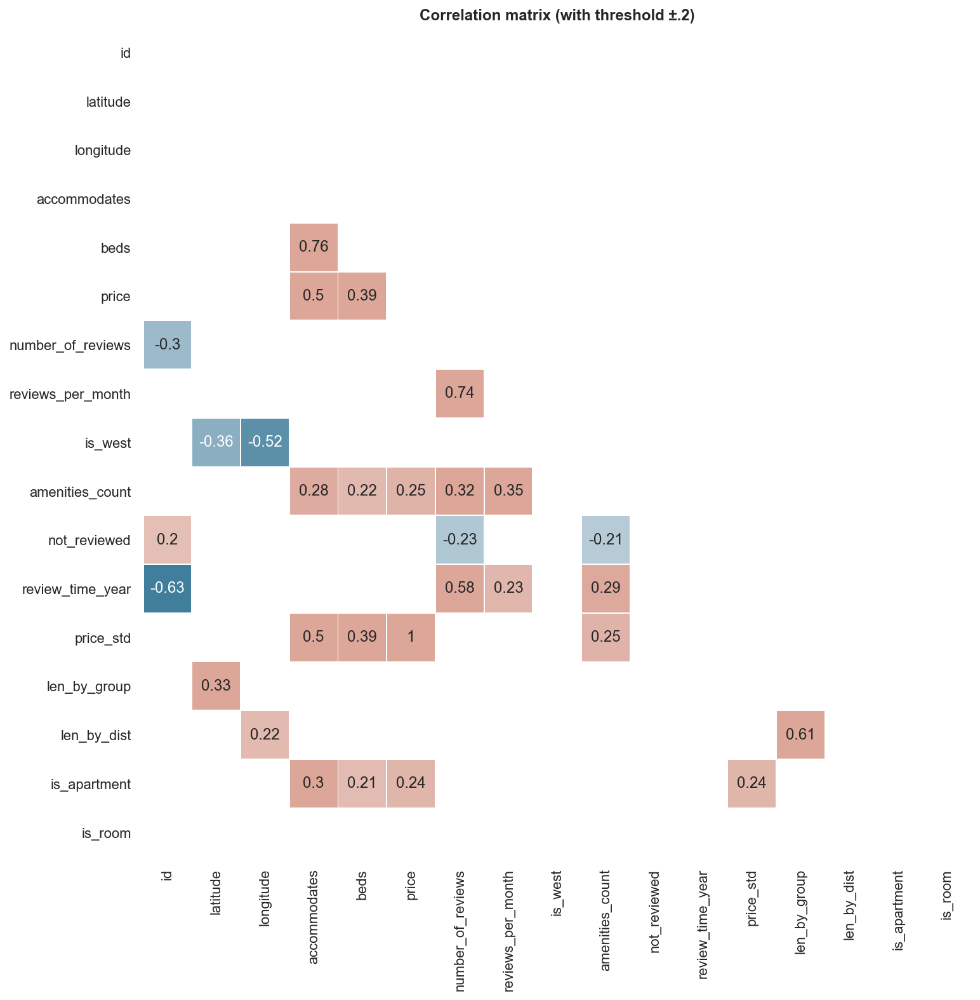

In [13]:
# Correlation analyis with numeric features and without amenities for visual purpose.
# Absolute correlation coefficients less than .2 are dropped beacuse their poor correlation

# create corrlation matrix without amenities columns
cor_mat = df.iloc[:,~df.columns.str.contains('has')].corr()

# remove absolute correlation coefficients less than corr_threshold
corr_threshold = .2
cor_mat[abs(cor_mat) <= corr_threshold] = np.nan

# mask for the upper triangle
mask = np.triu(np.ones_like(cor_mat, dtype=bool))

# plot
fig, ax = plt.subplots(figsize=(12, 12))
cmap = sns.diverging_palette(230, 20, as_cmap=True, )
sns.heatmap(cor_mat, cmap=cmap,  center=0, mask=mask, vmax=.3, annot=True,
            square=True, linewidths=.5, cbar=False)
ax.set_title('Correlation matrix (with threshold ±.2)', fontweight='bold')
plt.show()

**Takeaway:** 

* most absolute correlation coefficients are smaller than < 0.5 and thus relatively weak.
* positive correlations (with >0.2) with price can be observed for apartments, total number of amenities, accommodations, and beds.
* no negative correlation for price exceeds a correlation coefficient of -0.2
* the total number of amenities is positively correlated with the number of accommodations, beds, and price
* beds and accommodations are strongly correlated with .076

**Visualise**

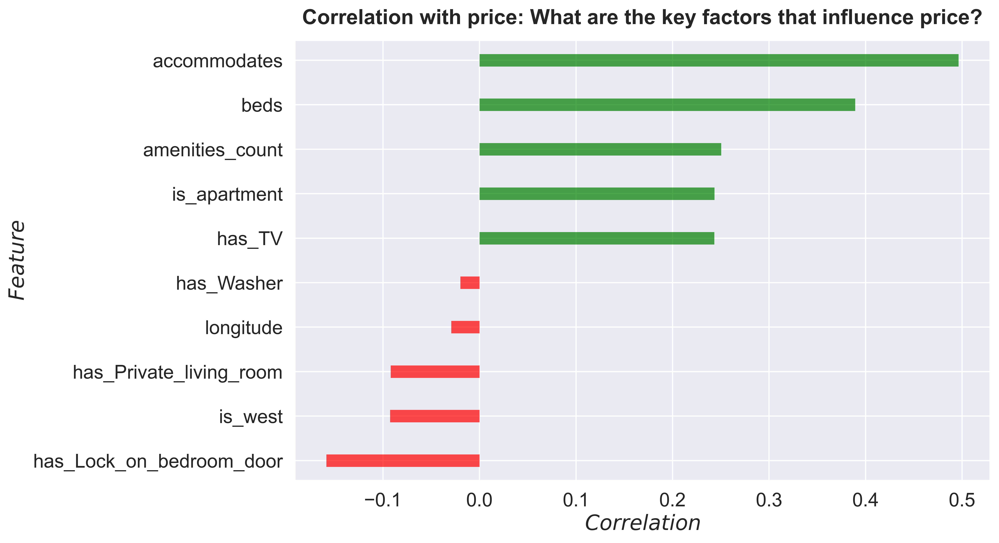

In [14]:
# Price specific analysis
sns.set(font_scale=1.4)
def corr_bar_plot(df, var:str, ax, top_tail=False):
    """
    Perform correlation analysis and plot r as horizontal bars.
    """
    
    # perform correlation and exctract variable
    corr_df = df.corr()
    corr_price = corr_df[[var]]
    
    # drop var 
    corr_price.drop(var, axis=0, inplace=True)
    if var == 'price':
        corr_price.drop('price_std', axis=0, inplace=True)
    
    # handle colors: red for negative and green for positive correlations
    corr_price['col'] = ['red' if price < 0 else 'green' for price in corr_price[var]]
    
    if top_tail:        
        top = corr_price.nlargest(columns=[var], n=top_tail)
        tail = corr_price.nsmallest(columns=[var], n=top_tail)
        corr_price = pd.concat([top, tail])
    
    corr_price.sort_values(var, inplace=True)
    corr_price.reset_index(inplace=True)
      
    # plot
    ax.hlines(y=corr_price.index, xmin=0, xmax=corr_price[var], color=corr_price.col, alpha=0.7, linewidth=10)
    ax.set(ylabel='$Feature$',
           xlabel='$Correlation$')
    plt.yticks(corr_price.index, corr_price['index'])
    
    return ax

# plot correlation bars
fig, ax = plt.subplots(figsize=(10,6.5), dpi=300)
ax = corr_bar_plot(df, 'price', ax=ax, top_tail=5)
ax.set_title('Correlation with price: What are the key factors that influence price?', 
             fontweight= 'bold', y=1.02) 
plt.show()

# save figure
fig.savefig('./img/correlation_top5.png', dpi=300, format='png', bbox_inches='tight')

**Takeaway**:

* key positive factors are the number of accommodations, available beds, and the total number of amenities listed
* entire apartments tend to be more expensive 
* negative correlations are all weak with a correlation coefficient < 0.2
* accommodations with a lock on the bedroom door, a private living room, and a washing machine tend to have low prices, probably because they are more common in hostel-like, small, and shared apartments.
* very poor negative correlation for accommodations located in former West Berlin, where prices tend to be slightly lower. 
* no particular district seems to be well correlated with the price. 

**What are the most common amenities?**

In [15]:
# create a wordcloud
wordcloud = WordCloud(max_font_size=120, max_words=100, 
                      width=960, height=480,
                      collocations=False, background_color="white").generate(' '.join(all_amenities))

# plot a wordcloud
fig, ax = plt.subplots(figsize=(16,16), dpi=400)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

fig.savefig('./img/word_cloud.png', dpi=400, format='png', bbox_inches='tight')

**Takeaway**

* Most common amenities are kitchen, heating, Wifi, washer, hangers, essentials

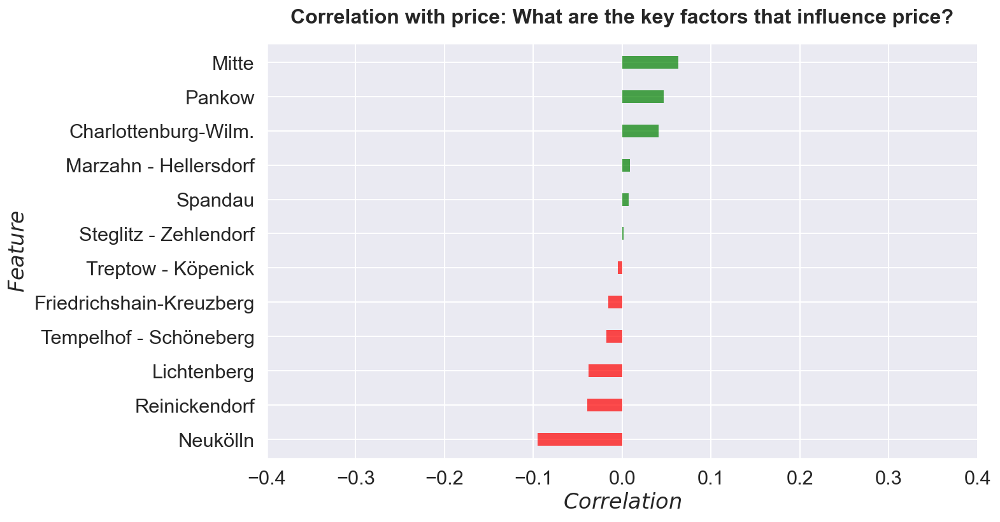

In [16]:
# correlation districts vs price
dums = pd.get_dummies(df.neighbourhood_group_cleansed)
tmp = df[['price','price_std']].join(dums)

fig, ax= plt.subplots(figsize=(10,6))
corr_bar_plot(tmp, 'price', ax=ax)
ax.set_title(f'Correlation with price: What are the key factors that influence price?', 
             fontweight= 'bold', fontsize=16, y=1.03) 
plt.xlim(-.4,.4)
plt.show()

**Takeaway**

* no district shows a clear correlation with price with correlation coefficients less than 0.1

### Question 2: Where are the most expensive neighbourhoods?

**Analyse**

In [17]:
# main columns derived from question 1
cols = ['price', 'accommodates' ,'beds','number_of_reviews', 'amenities_count']

In [18]:
# constrain analysis to 1 bed and 2 accommodates to lower the bias
df.query('(beds == 1.) & (accommodates == 2)').groupby(['is_west'])[cols].agg(np.median).dropna().T

is_west,False,True
price,49.0,40.0
accommodates,2.0,2.0
beds,1.0,1.0
number_of_reviews,5.0,4.0
amenities_count,14.0,12.0


In [19]:
# conatrain summary #2
display(df.groupby(['accommodates','is_west']).agg({'price':np.nanmedian}).head(10).T)

accommodates     1             2           3           4            5      
is_west      False True    False True  False True  False True   False True 
price         30.0  30.0  49.145  42.0  64.0  55.0  79.0  70.0  100.0  98.0

In [20]:
# neighbourhood_group vs. price
tmp = df.groupby(['neighbourhood_group_cleansed','is_west']).agg({'price':np.nanmedian}).round(2).dropna()
tmp.sort_values(by = 'price', inplace=True, ascending=False)
tmp

price
neighbourhood_group_cleansed is_west       
Mitte                        False     73.0
Pankow                       False     58.0
Charlottenburg-Wilm.         True      55.0
Marzahn - Hellersdorf        False     50.5
Friedrichshain-Kreuzberg     False     50.0
                             True      50.0
Tempelhof - Schöneberg       True      50.0
Treptow - Köpenick           False     50.0
Pankow                       True      49.0
Steglitz - Zehlendorf        True      49.0
Spandau                      True      43.5
Neukölln                     True      43.0
Mitte                        True      41.0
Lichtenberg                  False     40.0
Reinickendorf                True      40.0
                             False     30.0

In [21]:
# neighbourhood_group vs price contrained
tmp = df.query('(beds == 1.) & (accommodates == 2)').groupby(['neighbourhood_group_cleansed','is_west']).agg({'price':np.nanmedian}).round(2).dropna()
tmp.sort_values(by = 'price', inplace=True, ascending=False)
tmp

,,price
neighbourhood_group_cleansed,is_west,
Mitte,False,60.0
Pankow,False,49.0
Friedrichshain-Kreuzberg,True,48.0
Charlottenburg-Wilm.,True,45.0
Friedrichshain-Kreuzberg,False,45.0
Spandau,True,45.0
Tempelhof - Schöneberg,True,45.0
Marzahn - Hellersdorf,False,40.0
Neukölln,True,40.0


**Visualise**

In [22]:
# Function to aggregte Data for geo-spatial analysis
def agg_and_plot(df_mat, 
                 aggfun=np.median,
                 neighbourhoods_path = './data/neighbourhoods.geojson',
                 wall_path = './data/berlin_wall.json'):
    """
    Plot the berlin map with color-coded var column for each district.
    """
    
    # read shapefile for neighbourhoods
    neighbours_shp = gpd.read_file(neighbourhoods_path)

    # create GeoDataFrame
    geo_df = gpd.GeoDataFrame(pd.merge(df_mat, neighbours_shp, 
                                    left_on='neighbourhood_cleansed', 
                                    right_on='neighbourhood')
                          )
    
    # aggreagte on 'level'
    geo_df = geo_df.dissolve(by='neighbourhood', aggfunc=aggfun)
    
    # read berlin-wall shape file
    berlin_wall = gpd.read_file(wall_path)
    
    return geo_df, berlin_wall


# create aggregated GeoDataFrame
geo_df_contr, wall = agg_and_plot(df.query('(beds <= 1) and (accommodates == 2)'), np.median)
geo_df, _ = agg_and_plot(df, np.median)        

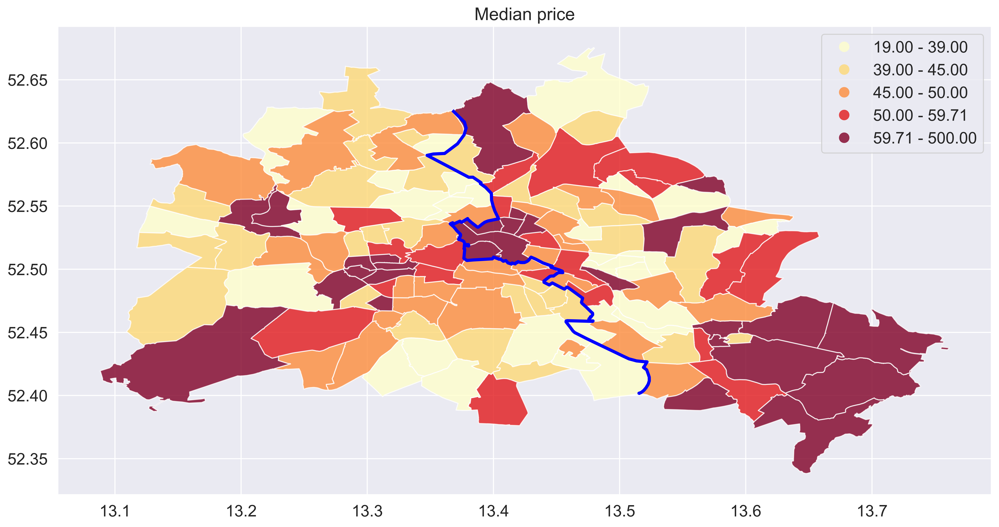

In [23]:
# Plot Median prices in each neighbourhood
fig, ax = plt.subplots(figsize=(16,16), dpi=300)

plot_dict = dict(cmap='YlOrRd', scheme='quantiles', alpha=.8, edgecolor='w', legend=True)

geo_df.plot(column='price', ax=ax, **plot_dict) # natural_breaks
wall.plot(color='blue', linewidth=3, ax=ax)
ax.set_title('Median price')
plt.show()

**Takeaway:**
* the most expensive districts are located in the central part and in some peripheral areas of Berlin
* peripheral areas are likely to be expensive due to the nature of their immediate vicinity
* the most expensive central districts are located in the former eastern part of Berlin, namely in the eastern parts of Mitte and Prenzlauer Berg
* while the extremely expensive eastern districts probably influence the average prices between East and West Berlin, **there is visually no other clear distinction between East and West**

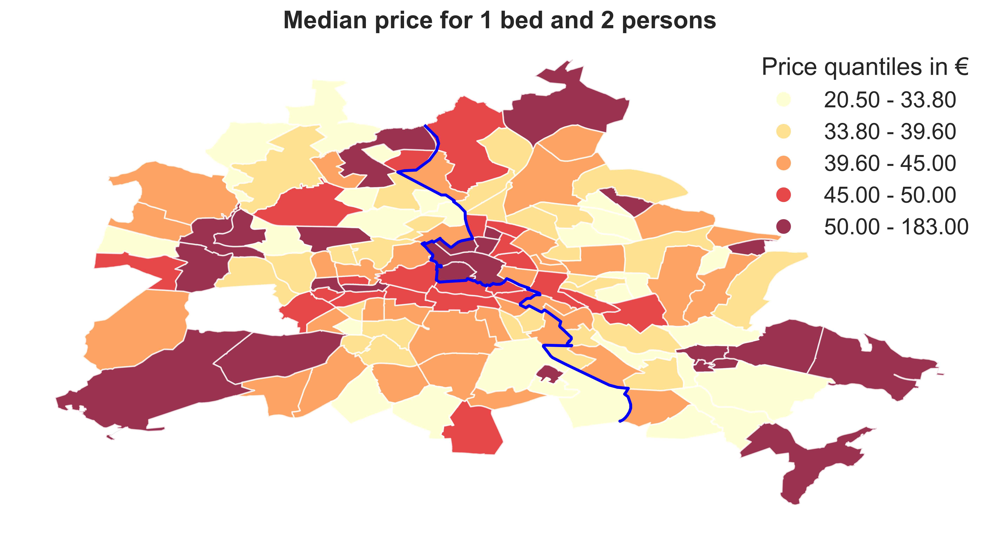

In [24]:
# map contrain with 1 bed and 2 people
fig, ax = plt.subplots(figsize=(12,12), dpi=300)

plot_dict = dict(cmap='YlOrRd', 
                 scheme='quantiles', 
                 alpha=.8, 
                 edgecolor='w', 
                 legend=True, 
                 legend_kwds=dict(loc='upper right', 
                                  frameon=False, 
                                  title='Price quantiles in €'),
                )

# plot price level
geo_df_contr.plot(column='price', ax=ax, **plot_dict)
# plot berlin wall
wall.plot(color='blue', linewidth=2, ax=ax)

ax.set_title('Median price for 1 bed and 2 persons', fontweight='bold')
ax.set_axis_off()
plt.show()

fig.savefig('./img/price_map_contrained.png', format='png', dpi=300, bbox_inches='tight')

**Takeaways:**
* the impressions above are also valid for 1 bed and 2 persons:
> * the most expensive districts are located in the central part and in some peripheral areas of Berlin
> * peripheral areas are likely to be expensive due to the nature of their immediate vicinity
> * the most expensive central districts are located in the former eastern part of Berlin, namely in the eastern parts of Mitte and Prenzlauer Berg
> * while the extremely expensive eastern districts probably influence the average prices between East and West Berlin, **there is visually no other clear distinction between East and West**

### Question 3: Where are the most frequently visited neighbourhoods?

**Analyse**

In [25]:
# neighbourhood_group vs popularity (in terms number of reviews per listings)
tmp = df.groupby(['neighbourhood_group_cleansed','is_west']).agg({'len_by_dist':np.nanmedian}).round(2).dropna()
tmp.sort_values(by = 'len_by_dist', inplace=True, ascending=False)
tmp

len_by_dist
neighbourhood_group_cleansed is_west             
Mitte                        False         1081.0
Neukölln                     True           657.0
Friedrichshain-Kreuzberg     True           571.0
                             False          565.0
Pankow                       False          495.0
Tempelhof - Schöneberg       True           388.0
Mitte                        True           359.0
Charlottenburg-Wilm.         True           150.0
Lichtenberg                  False          121.0
Pankow                       True           105.0
Steglitz - Zehlendorf        True            62.0
Treptow - Köpenick           False           42.0
Reinickendorf                True            32.0
Marzahn - Hellersdorf        False           27.0
Spandau                      True            19.0
Reinickendorf                False           15.0

**Visualise**

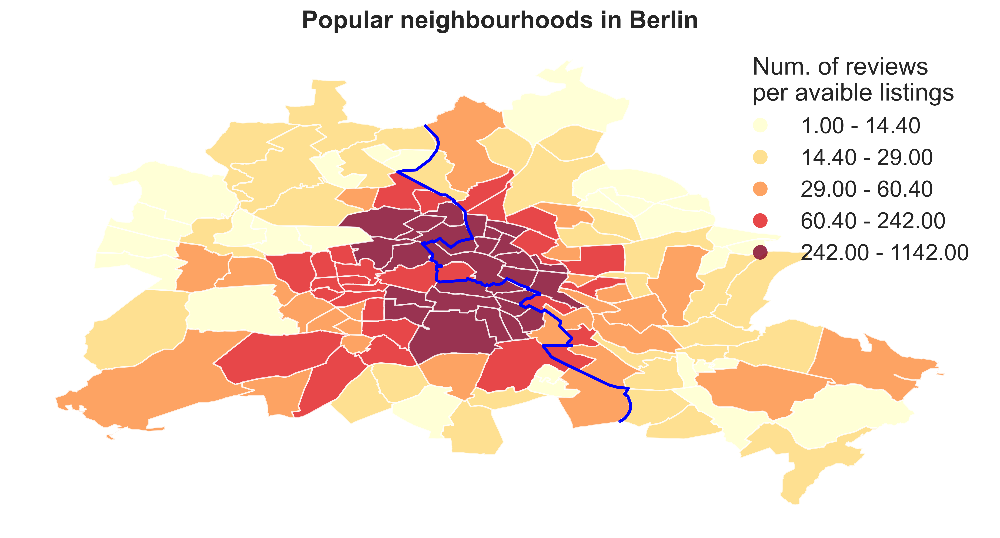

In [26]:
# Plot neighbourhoods and their median popularity 
fig, ax = plt.subplots(figsize=(12,12), dpi=300)

#plot_dict = dict(cmap='YlOrRd', scheme='box_plot', alpha=.8, edgecolor='w', legend=True)

plot_dict = dict(cmap='YlOrRd', 
                 scheme='quantiles', 
                 alpha=.8, 
                 edgecolor='w', 
                 legend=True, 
                 legend_kwds=dict(loc='upper right', 
                                  frameon=False, 
                                  title='Num. of reviews\nper avaible listings'),
                )

ax = geo_df.plot(column='len_by_dist',ax=ax, **plot_dict) # natural_breaks
wall.plot(color='blue', linewidth=2, ax=ax)
ax.set_title('Popular neighbourhoods in Berlin', fontweight='bold')
ax.set_axis_off()
plt.show()

fig.savefig('./img/popular_map.png', format='png', dpi=300, bbox_inches='tight')

**Takeaway:**

* most popular districts are located in the central part of Berlin, around the former Berlin Wall
* peripheral districts seem to be much less popular
* **no clear distinction between the former eastern and western parts**

### Extra question: How does the reviews change over time?

**Analyse**

In [27]:
# read reviews file and merge it to get the 'is_west' feature
reviews = pd.read_csv('./data/reviews.csv', parse_dates=['date'])
reviews = reviews.merge(df[['id','is_west']], left_on='listing_id', right_on='id')

# set dates as index and add boolean feature 
reviews.set_index('date', inplace=True)
reviews.drop(['listing_id'], axis=1, inplace=True)
reviews.head()

,id,is_west
date,,
2016-04-11,2015,False
2016-04-15,2015,False
2016-04-26,2015,False
2016-05-10,2015,False
2016-05-14,2015,False


**Visualise**

In [28]:
# plot reviews over time

# resample dates by 'resample_fct', count the number, and split west and eastern counts
resample_fct = 'M'
reviews_resampled = pd.DataFrame()
reviews_resampled['reviews_sum'] = reviews.id.resample(resample_fct).count()
reviews_resampled['reviews_sum_west'] = reviews.is_west.resample(resample_fct).sum()
reviews_resampled['reviews_sum_east'] = reviews_resampled['reviews_sum'] - reviews_resampled['reviews_sum_west']

# drop dates before 2013 for visualization
reviews_resampled = reviews_resampled.truncate(before='2013')

# plot
fig, ax = plt.subplots(figsize=(16,8), dpi=400)
ax.plot(reviews_resampled.index, reviews_resampled.reviews_sum, c='grey', alpha=.4, label='Absolute')
ax.plot(reviews_resampled.index, reviews_resampled.reviews_sum_west, c='r', alpha=.8, label='West Berlin')
ax.plot(reviews_resampled.index, reviews_resampled.reviews_sum_east, c='b', alpha=.8, label='East Berlin')
plt.legend()
ax.set_title('Number of reviews over Time in former West- and East Berlin', fontweight='bold', fontsize=14)
ax.set(xlabel='Year', ylabel='Freqeuncy of reviews')
plt.show()

**Takeaway:**

* seasonal influences can be clearly seen
* no differences between the former East and West Berlin
* number of reviews grows each year - until 2020 with the pandamie-conditioned strong decrease